In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5


Cloning into 'yolov5'...
remote: Enumerating objects: 15529, done.
remote: Counting objects: 100% (136/136), done.
remote: Compressing objects: 100% (93/93), done.
remote: Total 15529 (delta 49), reused 118 (delta 43), pack-reused 15393
Receiving objects: 100% (15529/15529), 14.59 MiB | 15.12 MiB/s, done.
Resolving deltas: 100% (10573/10573), done.
/content/yolov5


In [ ]:
!pip install roboflow

from roboflow import Roboflow


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.2/56.2 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 3.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 448.7 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.8 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9676 sha256=f7ed33ae257037612dc39a3560ae923ce4f51e5c70426333c27758b3021e6720
  Stored in directory: /root/.cache/pip/wheels/04/5f/3e/46cc37c5d698415694d83f607f833f83f0149e49b3af9d0f38
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pyparsing-3.0.9:
      Successfully uninstalled pyparsing-3.0.9
  Attempting uninstall: idna
    Found existing installation: idna 3.4
    Uninstalling idna-3.4:
   

In [ ]:

import torch
import os
from IPython.display import Image, clear_output


In [ ]:
os.environ["DATASET_DIRECTORY"]="/content/datasets"

In [ ]:


rf = Roboflow(api_key="ULwHCYvJfot1qaMRzNwT")
project = rf.workspace("bob-bfth9").project("car-damage-analysis")
dataset = project.version(3).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/Car-Damage-Analysis-3 in yolov5pytorch:: 100%|██████████| 818/818 [00:00<00:00, 2171.65it/s]


In [ ]:
%cat {dataset.location}/data.yaml

names:
- Car Dent
- Crash
- Headlight
- Mirror
- back Light
- scratches
- tyre
- wind Screen
nc: 8
roboflow:
  license: MIT
  project: car-damage-analysis
  url: https://universe.roboflow.com/bob-bfth9/car-damage-analysis/dataset/3
  version: 3
  workspace: bob-bfth9
test: ../test/images
train: /content/datasets/Car-Damage-Analysis-3/train/images
val: /content/datasets/Car-Damage-Analysis-3/valid/images


In [ ]:
!python train.py --img 416 --batch 16 --epochs 50 --data {dataset.location}/data.yaml --weights yolov5x.pt --cache

requirements: YOLOv5 requirement "gitpython" not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.9 MB/s eta 0:00:00

requirements: 1 package updated per ['gitpython']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

train: weights=yolov5x.pt, cfg=, data=/content/datasets/Car-Damage-Analysis-3/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 416 --conf 0.4 --source {dataset.location}/valid/images

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/datasets/Car-Damage-Analysis-3/valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-145-g94714fe Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 322 layers, 86220517 parameters, 0 gradients
image 1/80 /content/datasets/Car-Damage-Analysis-3/valid/images/0001_JPEG.rf.e89755300823954eff4ed6fae6344804.jpg: 416x416 (no detections), 45.7ms
image 2/80 /content/datasets/Car-Damage-Analysis-3/valid/images/0007_JPEG.rf.f3af19069151d4ef45f578

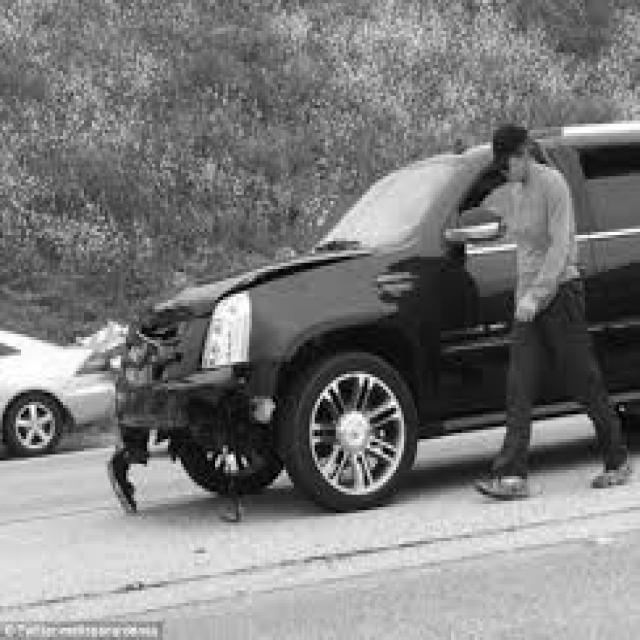

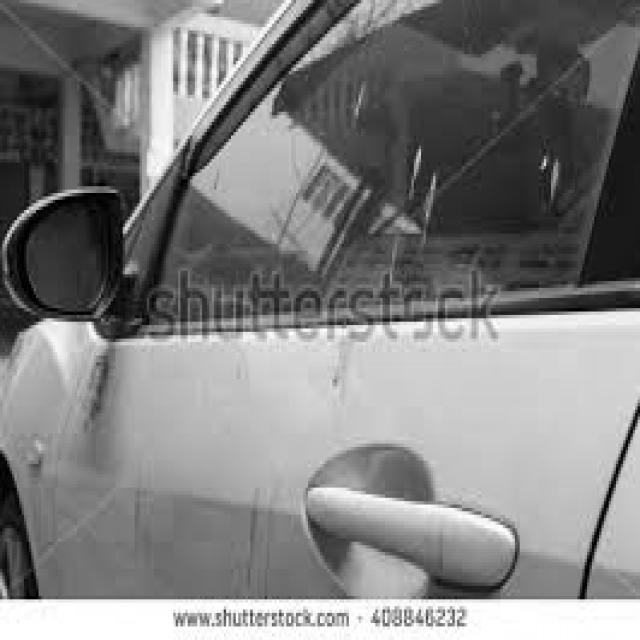

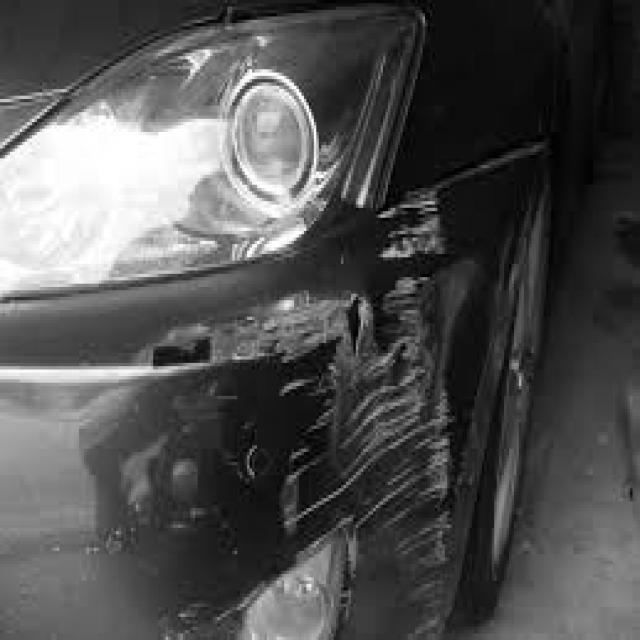

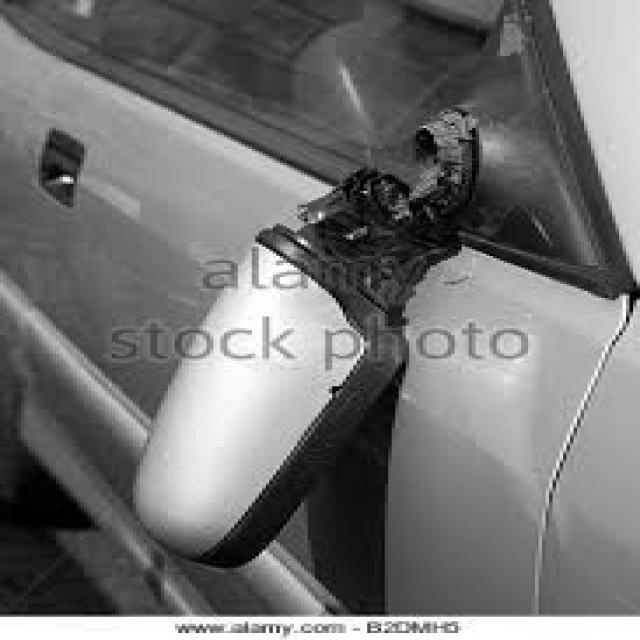

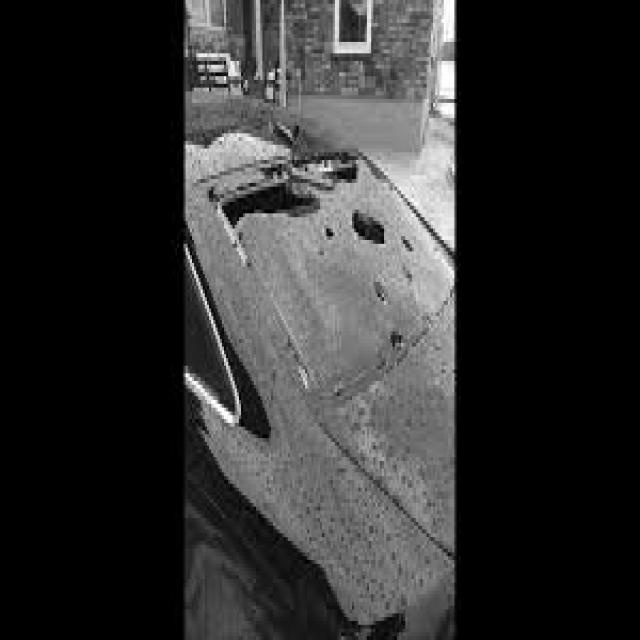

...

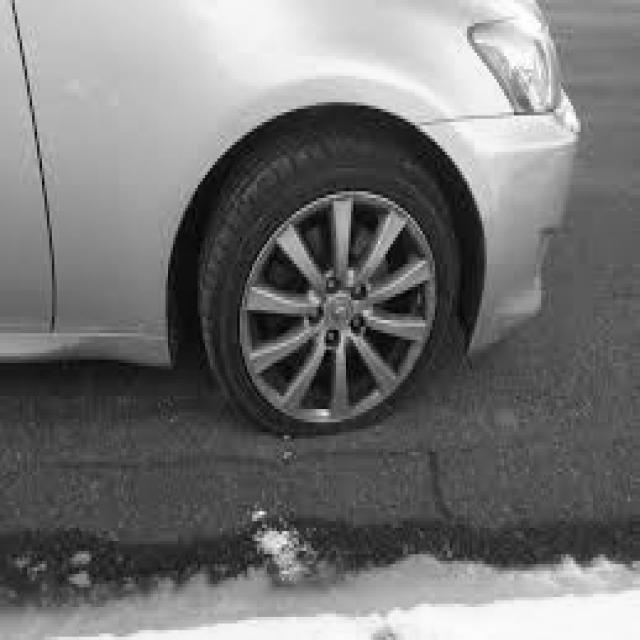

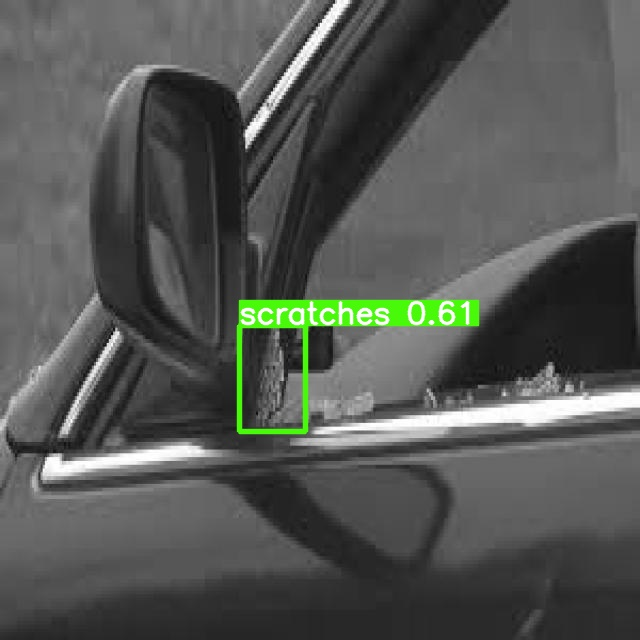

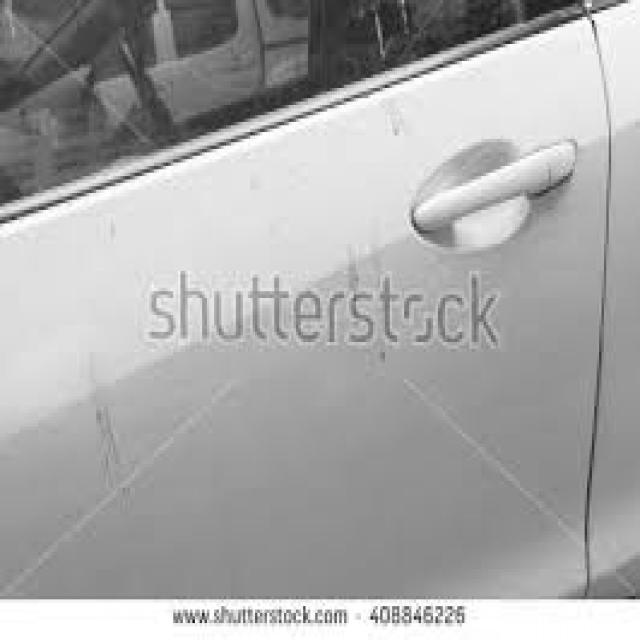

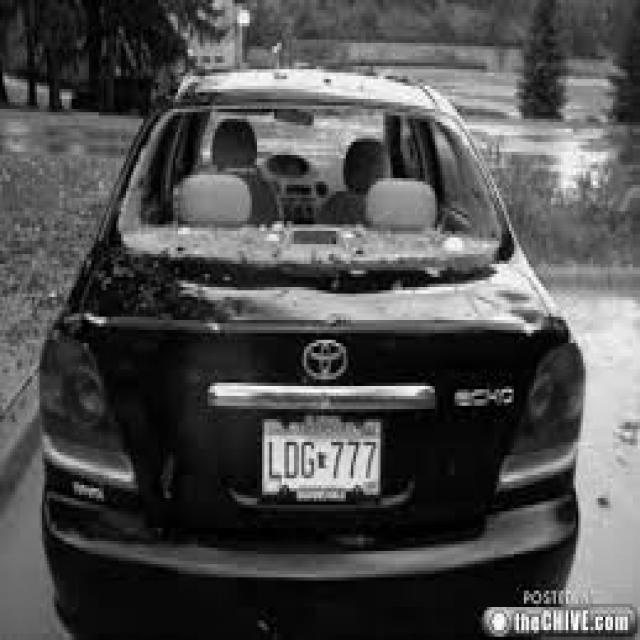

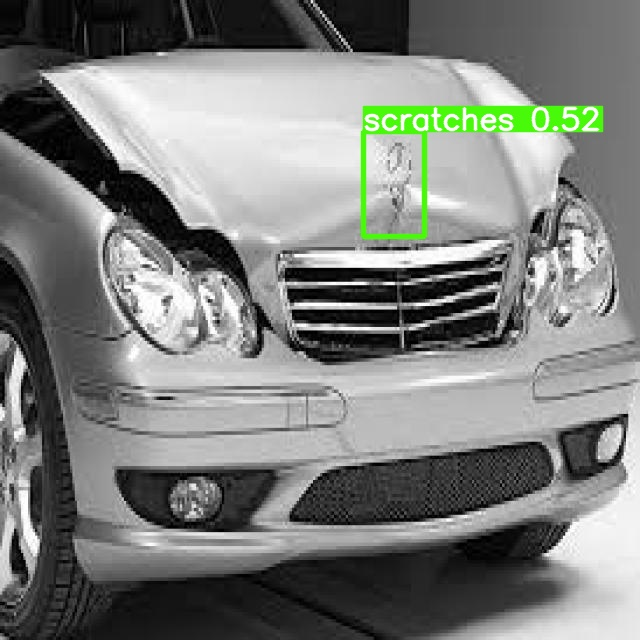

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

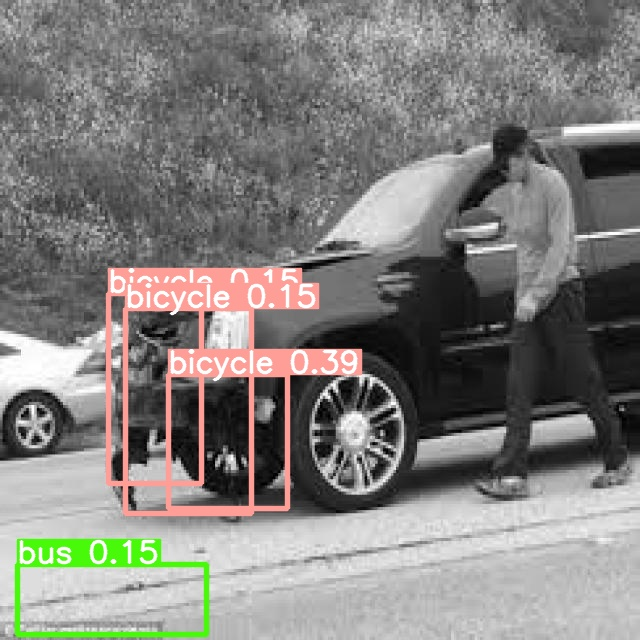

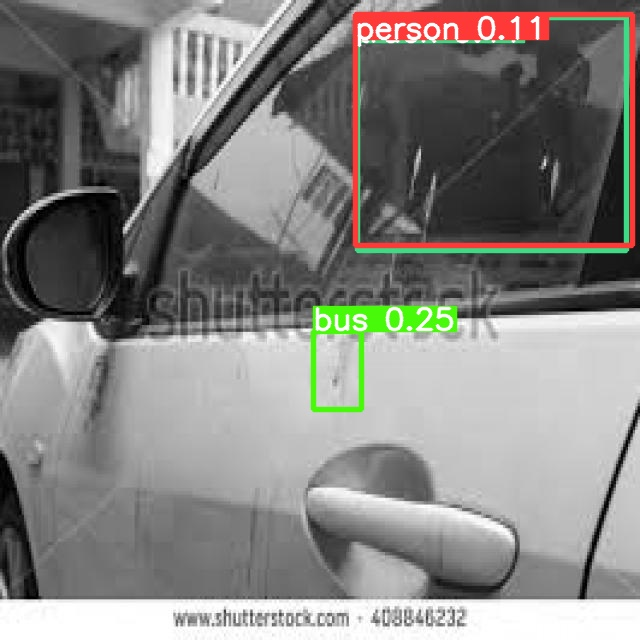

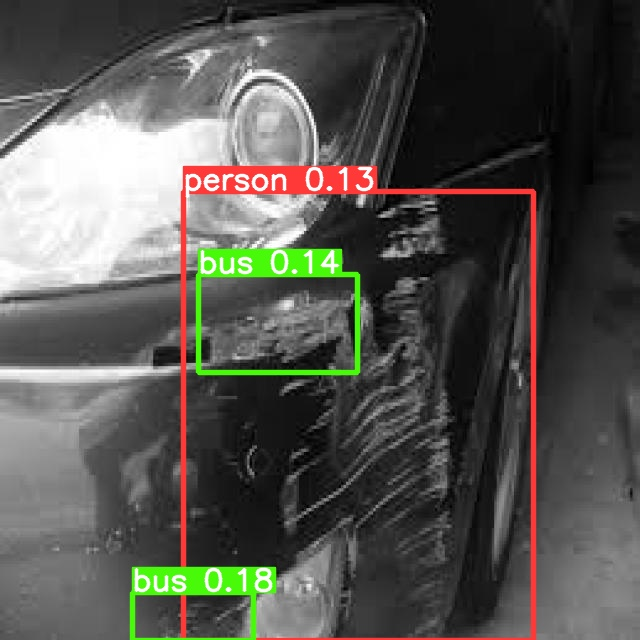

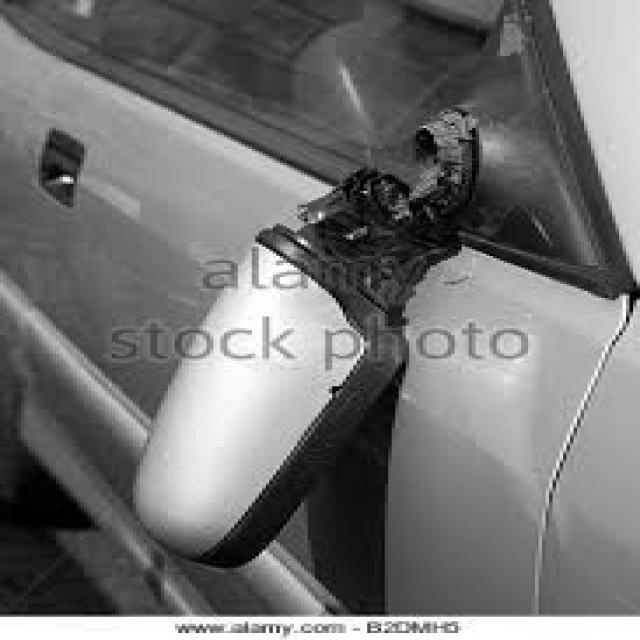

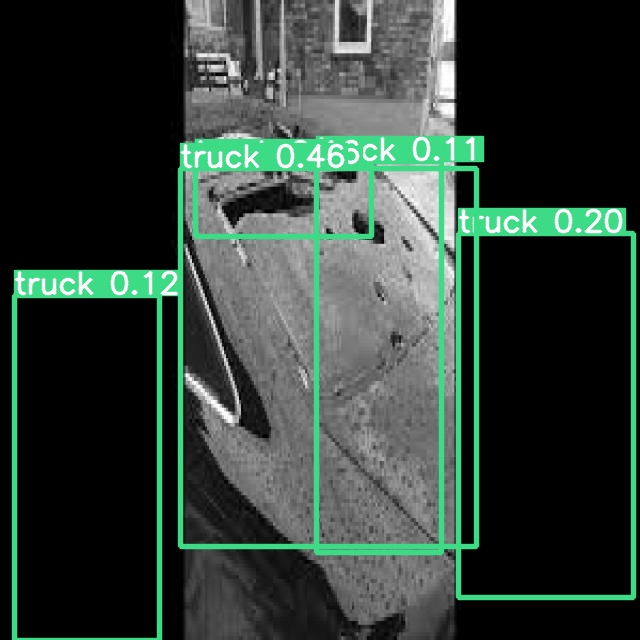

...

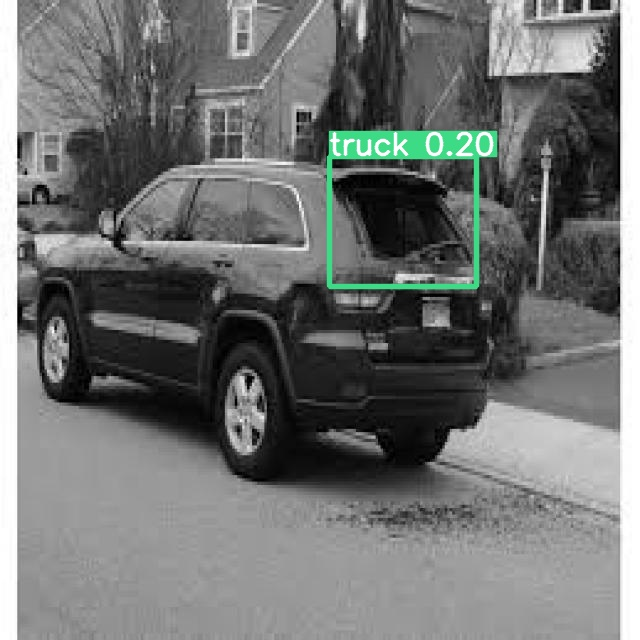

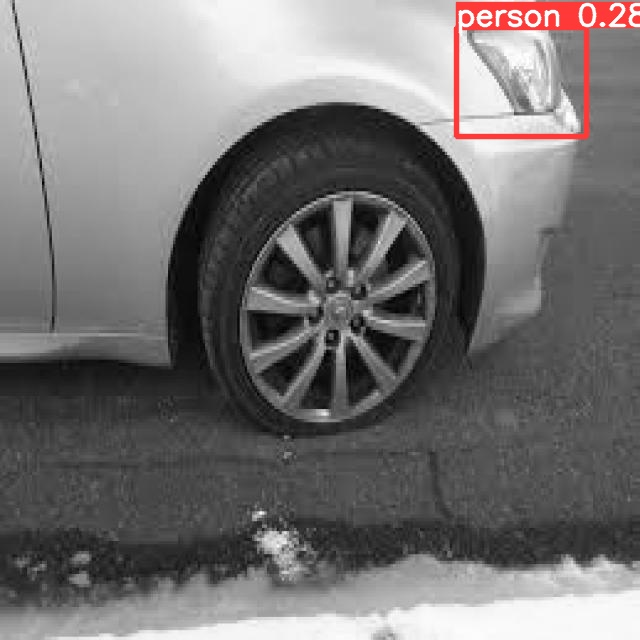

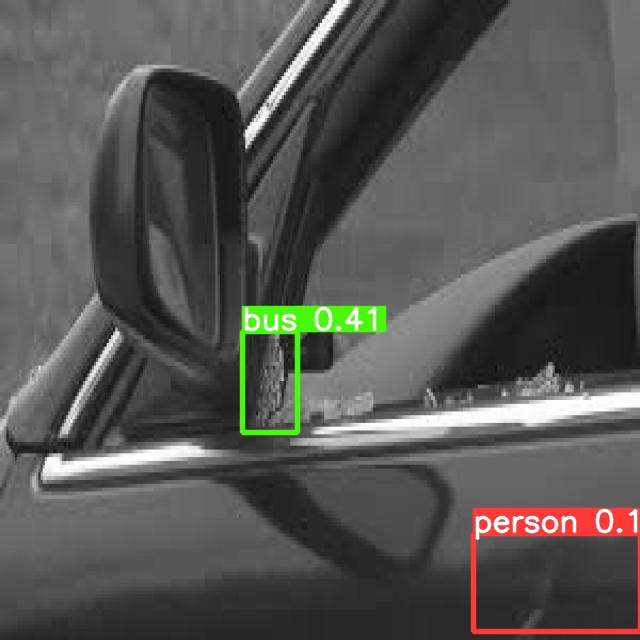

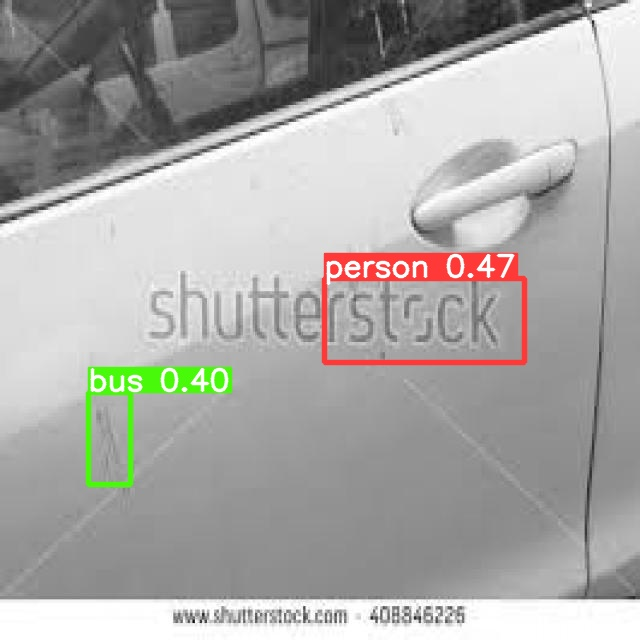

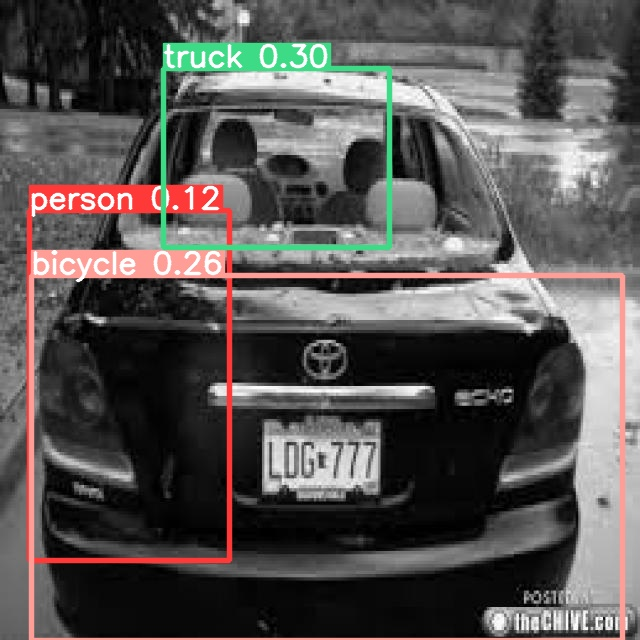

In [ ]:
import glob
from IPython.display import Image, display

i=0
for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'):
  i+=1
  if i<80:
    display(Image(filename=imageName))
    print("\n")

In [ ]:
!python export.py --weights runs/train/exp/weights/best.pt --include tflite --img 640



export: data=data/coco128.yaml, weights=['runs/train/exp/weights/best.pt'], imgsz=[640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['tflite']
YOLOv5 🚀 v7.0-145-g94714fe Python-3.9.16 torch-2.0.0+cu118 CPU

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from runs/train/exp/weights/best.pt with output shape (1, 25200, 9) (13.8 MB)

TensorFlow SavedModel: starting export with tensorflow 2.12.0...

                 from  n    params  module                                  arguments                     
2023-04-16 05:01:58.872728: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:266] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
  0                -1  1      3

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best-fp16.tflite --img 640 --conf 0.1 --source {dataset.location}/valid/images

detect: weights=['/content/yolov5/runs/train/exp/weights/best-fp16.tflite'], source=/content/datasets/Car-Damage-Analysis-2/valid/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-145-g94714fe Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Loading /content/yolov5/runs/train/exp/weights/best-fp16.tflite for TensorFlow Lite inference...
INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
image 1/4 /content/datasets/Car-Damage-Analysis-2/valid/images/download_jpeg.rf.845705517fc4f52703710a9d986f4ee0.jpg: 640x640 (no detections), 368.8ms
image 2/4 /